## Практическая работа №5

In [25]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import cv2
import os

In [26]:
directory = 'C:/Users/danil/Desktop/dataset/'
classes = ["milonov", "poperechniy", "other_people"]

all_images = []
image_size = 224
num_classes = 3

for name in classes:
    current_path = os.path.join(directory, name)
    class_number = classes.index(name)
    for image in os.listdir(current_path):
        current_image = cv2.imread(os.path.join(current_path, image))
        current_image = cv2.cvtColor(current_image, cv2.COLOR_BGR2RGB)
        current_image = cv2.resize(current_image, (image_size, image_size), interpolation = cv2.INTER_AREA)
        all_images.append([current_image, class_number])

In [27]:
random.shuffle(all_images)

X_images = []
Y_images = []
for features, label in all_images:
    X_images.append(features)
    Y_images.append(label)
X_images = np.array(X_images)
Y_images = np.array(Y_images)

In [28]:
X_images = X_images.reshape(-1, image_size, image_size, 3)
X_images = X_images / 255
#print("Shape of X_images:", X_images.shape)

In [29]:
from keras.utils import to_categorical
Y_images = to_categorical(Y_images, num_classes = 3)

In [30]:
from sklearn.metrics import confusion_matrix
import itertools
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X_images, Y_images, test_size = 0.10, random_state = 42)
#print("Shape of X_train:", X_train.shape, "and shape of X_test:", X_test.shape)
#print("Shape of Y_train:", Y_train.shape, "and shape of Y_test:", Y_test.shape)

In [32]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

from keras.utils.np_utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau

model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape = (image_size, image_size, 3), activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2, 2)))
model.add(Conv2D(64, (3, 3), activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2, 2)))
model.add(Conv2D(128, (3, 3), activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2, 2)))
model.add(Flatten())
model.add(Dense(128, activation = 'relu'))
model.add(Dense(3, activation = 'softmax'))

In [49]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam

datagen = ImageDataGenerator(rotation_range = 90,
                             width_shift_range = 0.3,
                             height_shift_range = 0.3,
                             shear_range = 0.5,
                             zoom_range = 0.5,
                             horizontal_flip = True,
                             fill_mode = 'nearest')

optimizer = Adam(learning_rate = 0.001)
model.compile(optimizer = optimizer,
                         loss = "categorical_crossentropy",
                         metrics = ['accuracy'])

epochs = 60
batch_size = 32

In [56]:
model.fit(datagen.flow(X_train, Y_train, batch_size = batch_size),
                    steps_per_epoch = X_train.shape[0] // batch_size,
                    epochs = 10)

Epoch 1/10
21/21 [==============================] - 23s 1s/step - loss: 0.3747 - accuracy: 0.8430
Epoch 2/10
21/21 [==============================] - 22s 1s/step - loss: 0.3431 - accuracy: 0.8714
Epoch 3/10
21/21 [==============================] - 23s 1s/step - loss: 0.3434 - accuracy: 0.8565
Epoch 4/10
21/21 [==============================] - 23s 1s/step - loss: 0.3588 - accuracy: 0.8610
Epoch 5/10
21/21 [==============================] - 24s 1s/step - loss: 0.3334 - accuracy: 0.8714
Epoch 6/10
21/21 [==============================] - 22s 1s/step - loss: 0.3624 - accuracy: 0.8430
Epoch 7/10
21/21 [==============================] - 25s 1s/step - loss: 0.3335 - accuracy: 0.8789
Epoch 8/10
21/21 [==============================] - 25s 1s/step - loss: 0.3596 - accuracy: 0.8610
Epoch 9/10
21/21 [==============================] - 22s 1s/step - loss: 0.2992 - accuracy: 0.8744
Epoch 10/10
21/21 [==============================] - 22s 1s/step - loss: 0.3352 - accuracy: 0.8729


# Результаты

In [74]:
from tensorflow.keras.preprocessing import image

def load_current_image(img_path, show = False):
    img = image.load_img(img_path, target_size = (224, 224))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis = 0)         
    img_tensor = img_tensor / 255.                                      

    if show:
        plt.figure(figsize = (30, 30))
        plt.imshow(img)
        plt.axis('off')
        plt.show()
    
def prediction_picture(prediction_array):
    if prediction_array[0][2] > prediction_array[0][1] and prediction_array[0][2] > prediction_array[0][0]:
        print("Other")
    elif prediction_array[0][0] > prediction_array[0][1] and prediction_array[0][0] > prediction_array[0][2]:
        print("Milonov")
    elif prediction_array[0][1] > prediction_array[0][0] and prediction_array[0][1] > prediction_array[0][2]:
        print("Poperechniy")
        
def show_image(image):
    plt.figure(figsize = (30, 30))
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    
def show_cropped_image(image):
    plt.figure(figsize = (4, 4))
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    
def classify_faces(image, model):
    face_detector = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")
    faces = face_detector.detectMultiScale(image, scaleFactor = 1.1, minNeighbors = 5, minSize = (30, 30))
    
    for (x, y, w, h) in faces:
        cv2.rectangle(image, (x - 30, y - 30), (x + w + 30, y + h + 30), (255, 0, 0), 2)
        cropped_image = image[y - 25 : y + h + 25, x - 25 : x + w + 25].copy()
        cropped_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB)
        cropped_image = cv2.resize(cropped_image, (224, 224))
        show_cropped_image(cropped_image)
        cropped_image = np.expand_dims(cropped_image, axis = 0)
        prediction_picture(model.predict(cropped_image))
        
    show_image(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

In [61]:
test_images = ['test.png', 'test3.jpg']
directory = 'C:/Users/bulen/Desktop/'
for image_link_name in test_images:
    current_path = os.path.join(directory, image_link_name)
    current_image = load_image(current_path, True)
    current_prediction = model.predict(current_image)

AttributeError: 'numpy.ndarray' object has no attribute 'load_img'

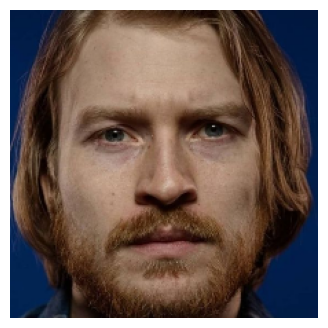

1/1 [==============================] - 0s 33ms/step
Poperechniy


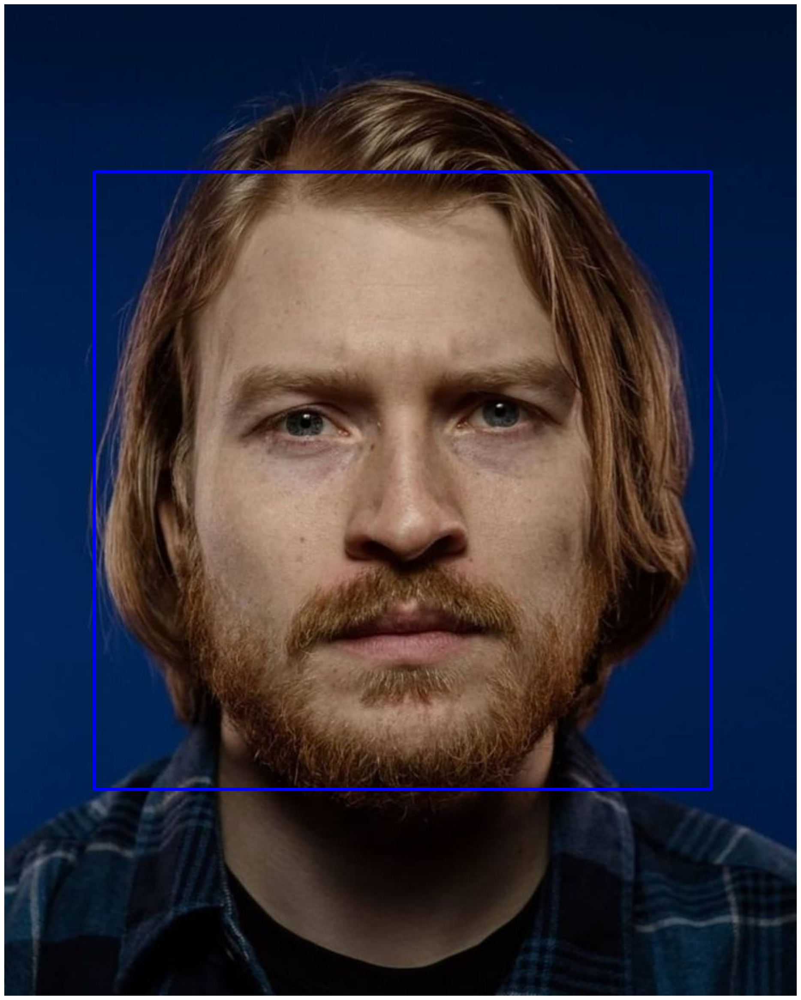

<-------------------------------->


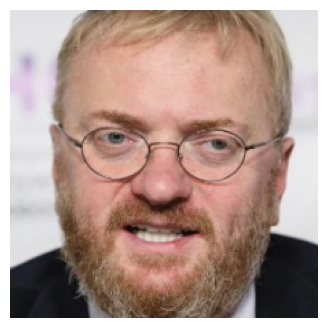

1/1 [==============================] - 0s 34ms/step
Milonov


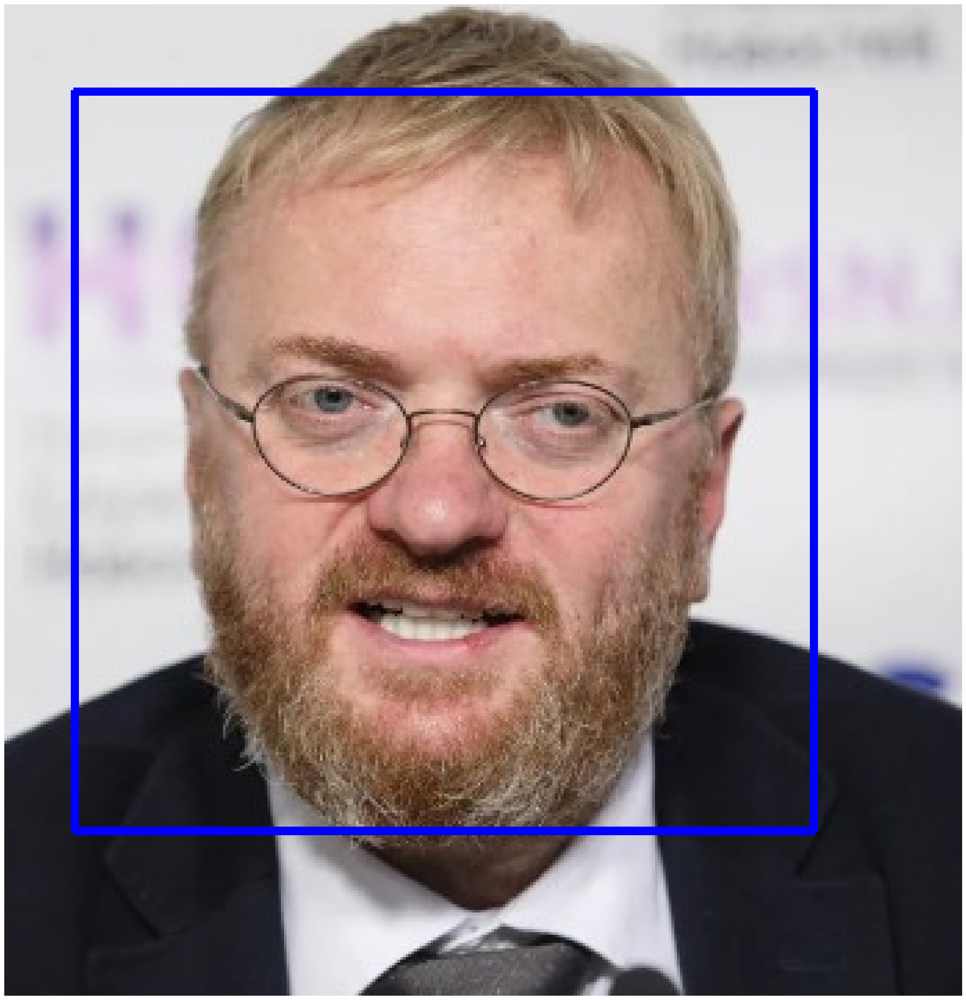

<-------------------------------->


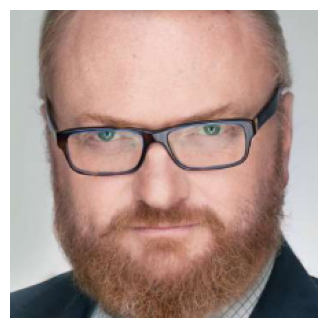

1/1 [==============================] - 0s 34ms/step
Milonov


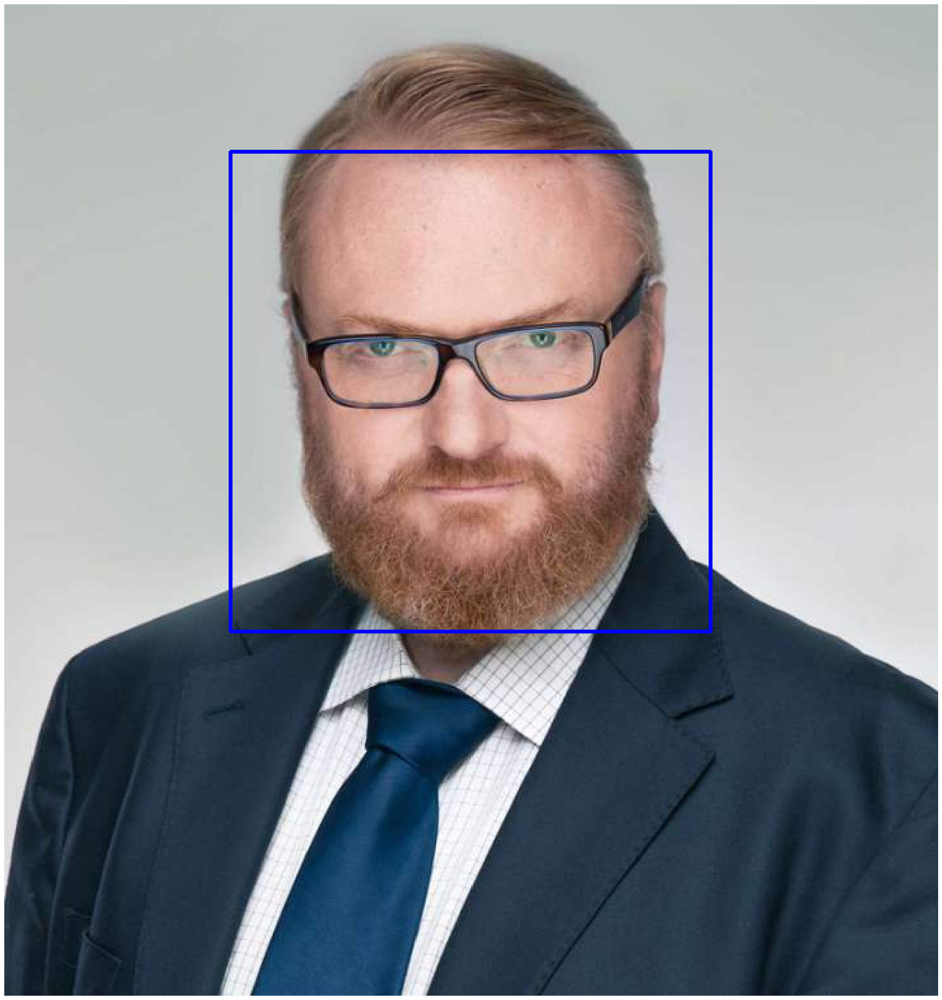

<-------------------------------->


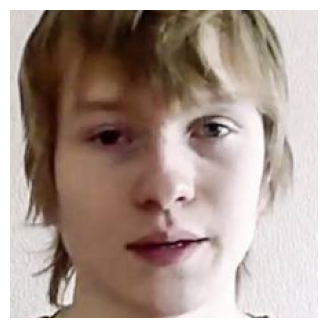

1/1 [==============================] - 0s 38ms/step
Milonov


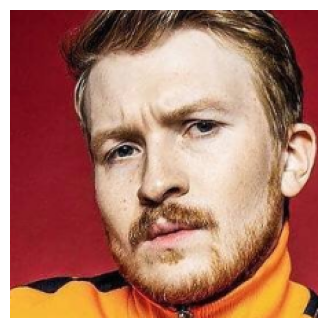

1/1 [==============================] - 0s 35ms/step
Poperechniy


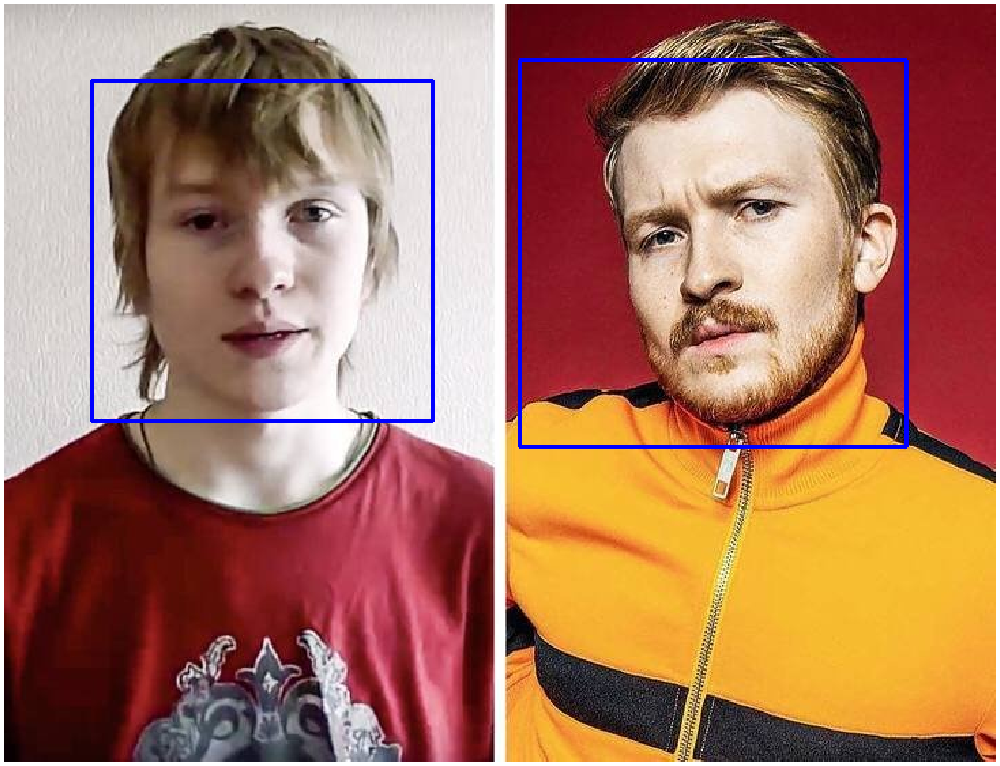

<-------------------------------->


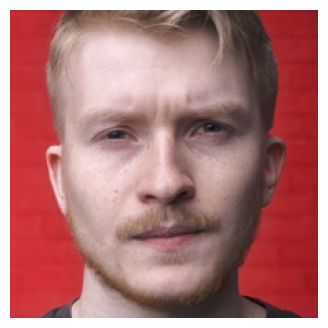

1/1 [==============================] - 0s 33ms/step
Poperechniy


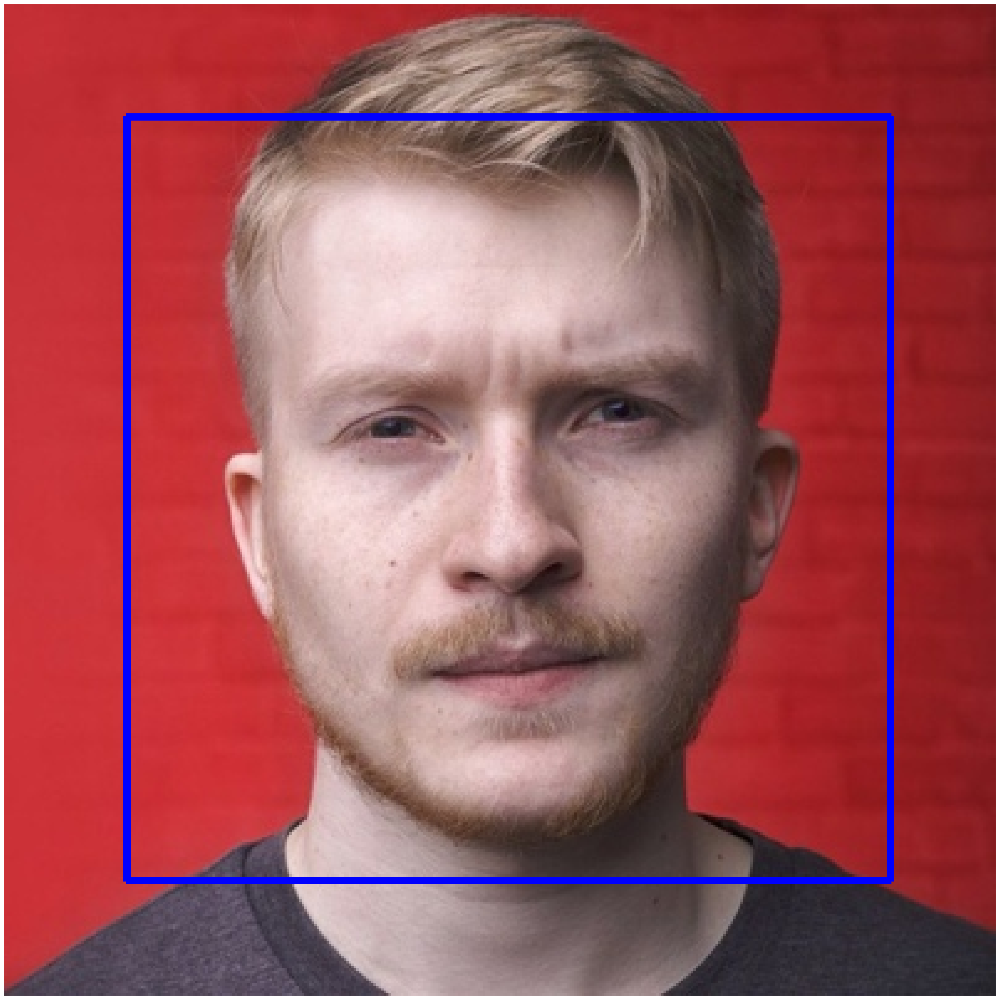

<-------------------------------->


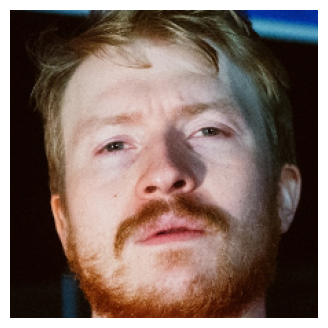

1/1 [==============================] - 0s 35ms/step
Poperechniy


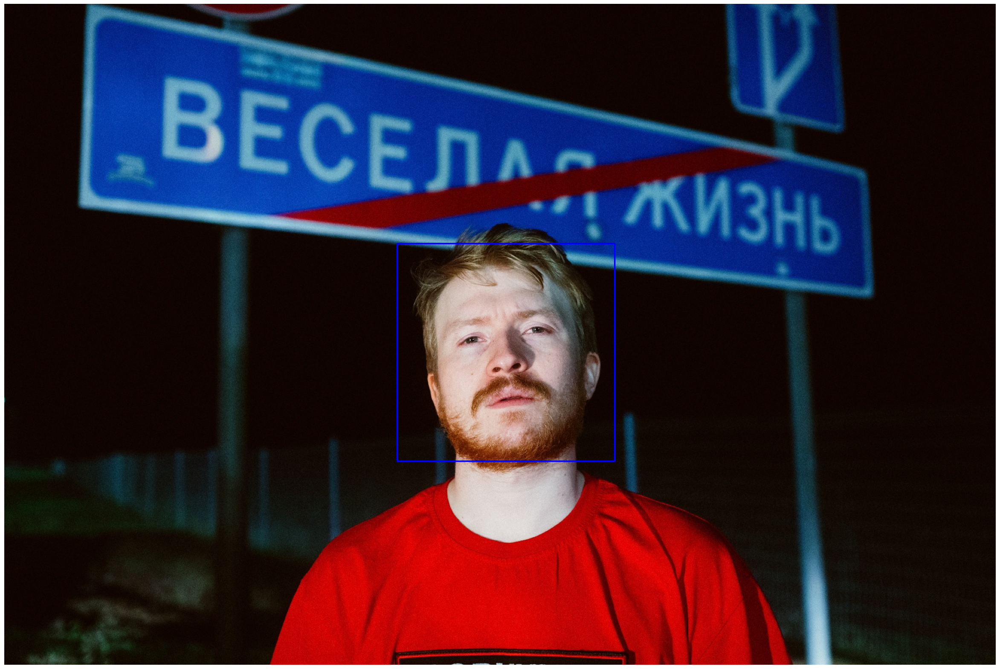

<-------------------------------->


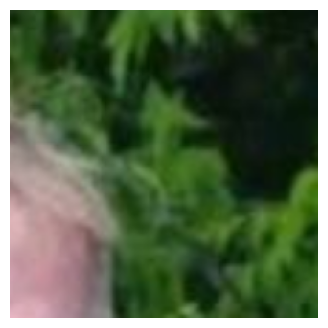

1/1 [==============================] - 0s 34ms/step
Poperechniy


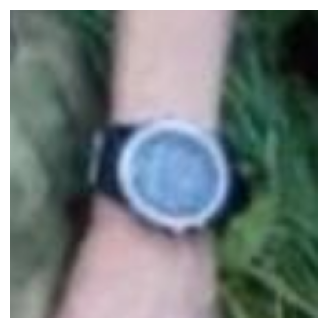

1/1 [==============================] - 0s 34ms/step
Poperechniy


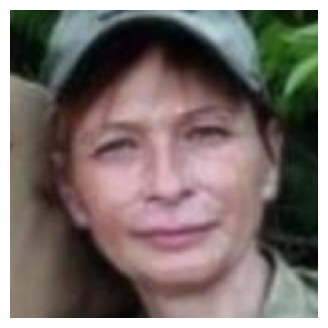

1/1 [==============================] - 0s 38ms/step
Other


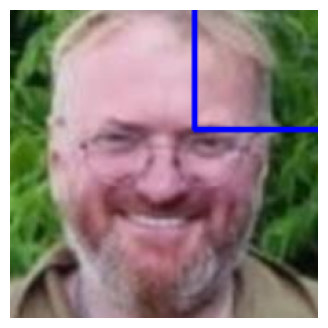

1/1 [==============================] - 0s 34ms/step
Milonov


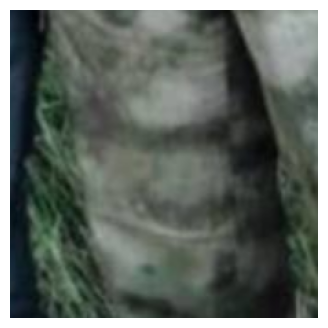

1/1 [==============================] - 0s 36ms/step
Poperechniy


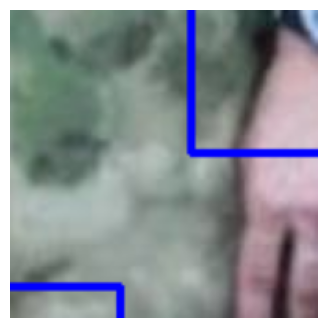

1/1 [==============================] - 0s 36ms/step
Poperechniy


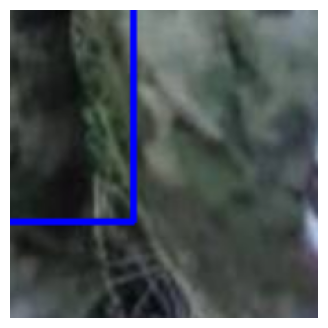

1/1 [==============================] - 0s 34ms/step
Poperechniy


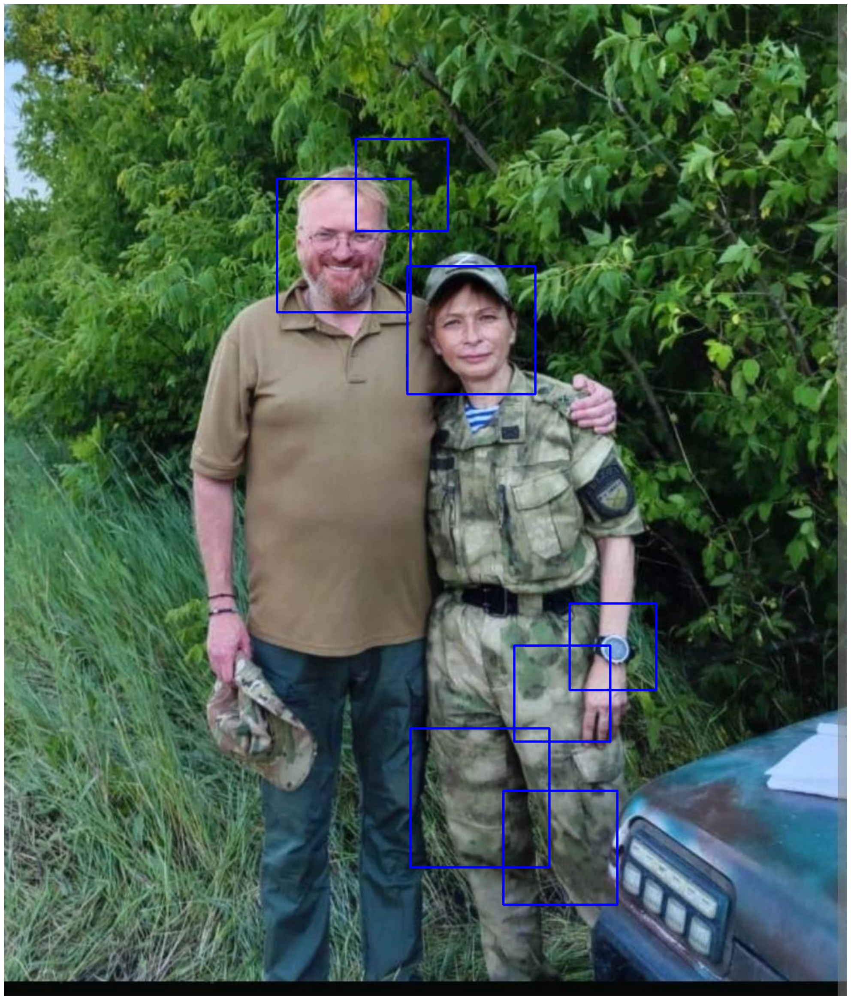

<-------------------------------->


In [92]:
image1 = cv2.imread("C:/Users/bulen/Desktop/test4.jpg")
image2 = cv2.imread("C:/Users/bulen/Desktop/test5.jpg")
image3 = cv2.imread("C:/Users/bulen/Desktop/test6.jpg")
image4 = cv2.imread("C:/Users/bulen/Desktop/test7.jpg")
image5 = cv2.imread("C:/Users/bulen/Desktop/test8.jpg")
image6 = cv2.imread("C:/Users/bulen/Desktop/test9.jpg")
image7 = cv2.imread("C:/Users/bulen/Desktop/test10.jpg")


test_images = [image1, image2, image3, image4, image5, image6, image7]
for elem in test_images:
    classify_faces(elem, model)
    print("<-------------------------------->")